
<br>
<font>
<div dir=ltr align=center>
<font color=0F5298 size=7>
    Machine Learning <br> <br>
<font color=2565AE size=5>
    CE Department <br>
    Fall 2024 - Prof. Sharifi Zarchi<br>
<font color=3C99D size=5>
    HW4 Practical <br>
    Image Colorization<br>
    Image Segmentation<br>
<font color=696880 size=4>
    Shayan Shabani


In [1]:
from google.colab import drive
drive.mount('/content/drive/')

Mounted at /content/drive/


This assignment is structured to introduce students to practical applications of generative models in computer vision.
It targets two challenging areas: colorization and segmentation, using architectures that are complex but very applicable in industry settings.
## Machine Learning Assignment #4: Practical Applications in Image Processing

## Learning Objectives:
By the end of this assignment, students will be able to:
1. Understand and implement Variational Autoencoders for image colorization.
2. Apply the U-Net architecture for image segmentation.
3. Preprocess image datasets, including augmentation techniques.
4. Analyze the performance of machine learning models using relevant metrics.
5. Explore the relationship between latent space and output quality in generative models.


# Image Colorization using VAE
In this section of the assignment, students will explore the fascinating field of image colorization using Variational Autoencoders (VAEs), a type of generative model in deep learning. The task involves transforming grayscale images into colored ones, leveraging the encoder-decoder architecture of VAEs, which are adept at learning complex data distributions. Students will implement and fine-tune an autoencoder network, utilizing components like perceptual loss and feature extraction from pre-trained models, to improve colorization output. By doing so, they will gain a deeper understanding of generative models and their practical applications in computer vision tasks. This exercise offers a hands-on opportunity to blend theoretical knowledge with practical coding skills, characterizing the creative potential of AI in image processing.

Dataset: https://drive.google.com/drive/folders/1KeJbfUykGnPlz0q08_b1IjtW8OxkPdQ9?usp=sharing

## Importing Libraries

In [ ]:
!pip install pytorch_lightning
!pip install seaborn

In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sea
from tqdm.notebook import tqdm
import os
import torch
import torch.nn as nn
import pytorch_lightning as pl
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import torch.nn.functional as F
import torchmetrics
from torchmetrics import Metric
import torchvision
import math
print(plt.style.available)
plt.style.use('seaborn-v0_8')
device = 'cuda' if torch.cuda.is_available() else 'cpu'

np.__version__, device

['Solarize_Light2', '_classic_test_patch', '_mpl-gallery', '_mpl-gallery-nogrid', 'bmh', 'classic', 'dark_background', 'fast', 'fivethirtyeight', 'ggplot', 'grayscale', 'seaborn-v0_8', 'seaborn-v0_8-bright', 'seaborn-v0_8-colorblind', 'seaborn-v0_8-dark', 'seaborn-v0_8-dark-palette', 'seaborn-v0_8-darkgrid', 'seaborn-v0_8-deep', 'seaborn-v0_8-muted', 'seaborn-v0_8-notebook', 'seaborn-v0_8-paper', 'seaborn-v0_8-pastel', 'seaborn-v0_8-poster', 'seaborn-v0_8-talk', 'seaborn-v0_8-ticks', 'seaborn-v0_8-white', 'seaborn-v0_8-whitegrid', 'tableau-colorblind10']


('1.26.4', 'cuda')

## Loading the Data

In [ ]:
import os
import pandas as pd
from tqdm import tqdm

def load_data(path):
    """
    Load dataset from a given path. Extracts file paths and class labels.

    Args:
        path (str): Path to the dataset folder where subfolders represent classes.

    Returns:
        pd.DataFrame: DataFrame containing file paths and corresponding class labels.
        dict: Mapping of class names to integer labels.
    """
    filenames = []
    outcomes = []
    class_map = {}

    # Map each subfolder (class) to a unique label
    for class_name in sorted(os.listdir(path)):  # Sorting ensures consistent mapping
        class_folder_path = os.path.join(path, class_name)

        if os.path.isdir(class_folder_path):
            if class_name not in class_map:
                class_map[class_name] = len(class_map)  # Assign unique integer label

            # Iterate through files in the class folder
            for file in tqdm(os.listdir(class_folder_path), desc=f"Processing {class_name}"):
                if file.lower().endswith(('.jpg', '.jpeg', '.png', '.bmp')):
                    filenames.append(os.path.join(class_folder_path, file))
                    outcomes.append(class_map[class_name])

    # Create and shuffle the DataFrame
    df = pd.DataFrame({'filepath': filenames, 'label': outcomes})
    df = df.sample(frac=1).reset_index(drop=True)  # Shuffle the DataFrame
    return df, class_map

# Load datasets
train_path = '/content/drive/MyDrive/Assignment4/train'
valid_path = '/content/drive/MyDrive/Assignment4/valid'
test_path = '/content/drive/MyDrive/Assignment4/test'

train_df, train_class_map = load_data(train_path)
val_df, val_class_map = load_data(valid_path)
test_df, test_class_map = load_data(test_path)

# Display dataset information
print()
print(f"Training DataFrame shape: {train_df.shape}")
print(f"Validation DataFrame shape: {val_df.shape}")
print(f"Test DataFrame shape: {test_df.shape}")
print(f"Class Mapping: {train_class_map}")


Processing AMERICAN KESTREL: 100%|██████████| 5/5 [00:00<00:00, 56223.91it/s]


Training DataFrame shape: (3208, 2)
Validation DataFrame shape: (100, 2)
Test DataFrame shape: (100, 2)
Class Mapping: {'ABBOTTS BABBLER': 0, 'ABBOTTS BOOBY': 1, 'ABYSSINIAN GROUND HORNBILL': 2, 'AFRICAN CROWNED CRANE': 3, 'AFRICAN EMERALD CUCKOO': 4, 'AFRICAN FIREFINCH': 5, 'AFRICAN OYSTER CATCHER': 6, 'AFRICAN PIED HORNBILL': 7, 'AFRICAN PYGMY GOOSE': 8, 'ALBATROSS': 9, 'ALBERTS TOWHEE': 10, 'ALEXANDRINE PARAKEET': 11, 'ALPINE CHOUGH': 12, 'ALTAMIRA YELLOWTHROAT': 13, 'AMERICAN AVOCET': 14, 'AMERICAN BITTERN': 15, 'AMERICAN COOT': 16, 'AMERICAN FLAMINGO': 17, 'AMERICAN GOLDFINCH': 18, 'AMERICAN KESTREL': 19}


In [ ]:
def combine_datasets(train_df, test_df):
    """
    Combines the training and test datasets into a single DataFrame.

    Args:
        train_df (pd.DataFrame): DataFrame containing training data.
        test_df (pd.DataFrame): DataFrame containing test data.

    Returns:
        pd.DataFrame: Combined DataFrame with training and test data.
    """
    combined_df = pd.concat([train_df, test_df], axis=0).reset_index(drop=True)
    return combined_df

# Combine the training and test data
combined_df = combine_datasets(train_df, test_df)

# Display the shape of the combined DataFrame
print("\nCombined DataFrame shape:", combined_df.shape)



Combined DataFrame shape: (3308, 2)


In [ ]:
combined_df.sample(10)

,filepath,label
680,/content/drive/MyDrive/Assignment4/train/AFRIC...,7
814,/content/drive/MyDrive/Assignment4/train/ALBAT...,9
2546,/content/drive/MyDrive/Assignment4/train/AMERI...,19
3094,/content/drive/MyDrive/Assignment4/train/AMERI...,16
2150,/content/drive/MyDrive/Assignment4/train/ALBER...,10
469,/content/drive/MyDrive/Assignment4/train/AMERI...,18
73,/content/drive/MyDrive/Assignment4/train/AMERI...,17
1228,/content/drive/MyDrive/Assignment4/train/AFRIC...,7
1796,/content/drive/MyDrive/Assignment4/train/AFRIC...,6
211,/content/drive/MyDrive/Assignment4/train/ALEXA...,11


## Plot some of the images

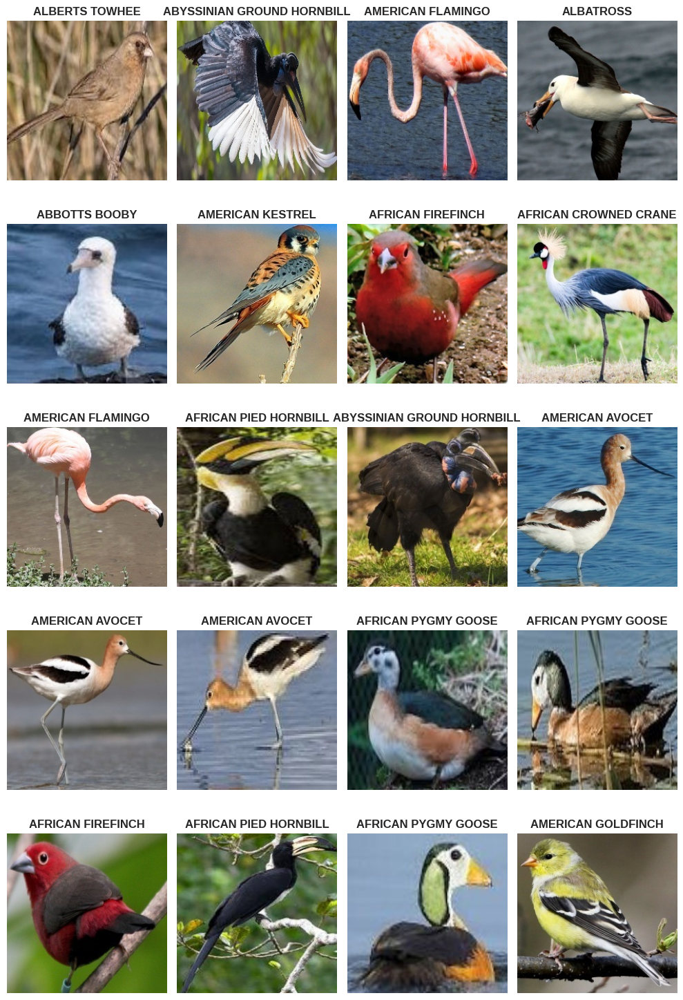

In [ ]:
import matplotlib.pyplot as plt
import cv2

def plot_images(dataframe, class_map, num_images=21):
    """
    Plots a grid of images along with their class names using the class map.

    Args:
        dataframe (pd.DataFrame): DataFrame with 'filepath' and 'label' columns.
        class_map (dict): Dictionary mapping class names to numeric labels.
        num_images (int): Total number of images to display in the grid.
    """
    # Invert the class map for label-to-class name conversion
    inverted_class_map = {v: k for k, v in class_map.items()}

    # Randomly sample the specified number of images
    sample_df = dataframe.sample(n=num_images).reset_index(drop=True)

    # Calculate rows and columns for the grid
    cols = 4
    rows = (num_images + cols - 1) // cols

    # Create a grid of subplots
    fig, axes = plt.subplots(rows, cols, figsize=(10, rows * 3))

    for i, ax in enumerate(axes.flatten()):
        if i < len(sample_df):
            # Load the image and its label
            img_path = sample_df.loc[i, 'filepath']
            label = sample_df.loc[i, 'label']
            class_name = inverted_class_map[label]

            # Read and convert the image to RGB
            img = cv2.imread(img_path)
            img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

            # Display the image
            ax.imshow(img)
            ax.axis('off')
            ax.set_title(class_name, fontsize=12, fontweight='bold')
        else:
            # Turn off axes for empty grid cells
            ax.axis('off')

    # Adjust layout
    plt.tight_layout()
    plt.show()

# Call the function with the combined DataFrame
plot_images(combined_df, train_class_map, num_images=20)


## Dataset Distribution
plot the distribution of the dataset, both training and validation set

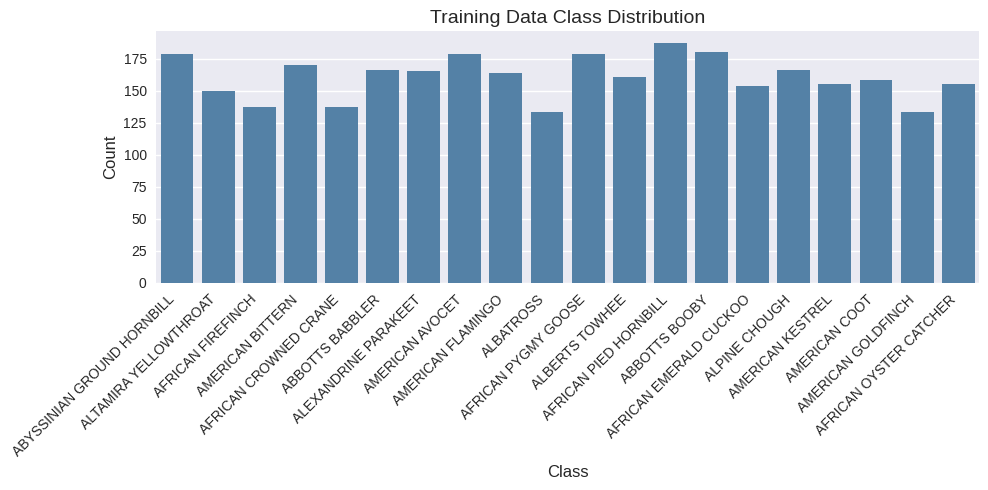

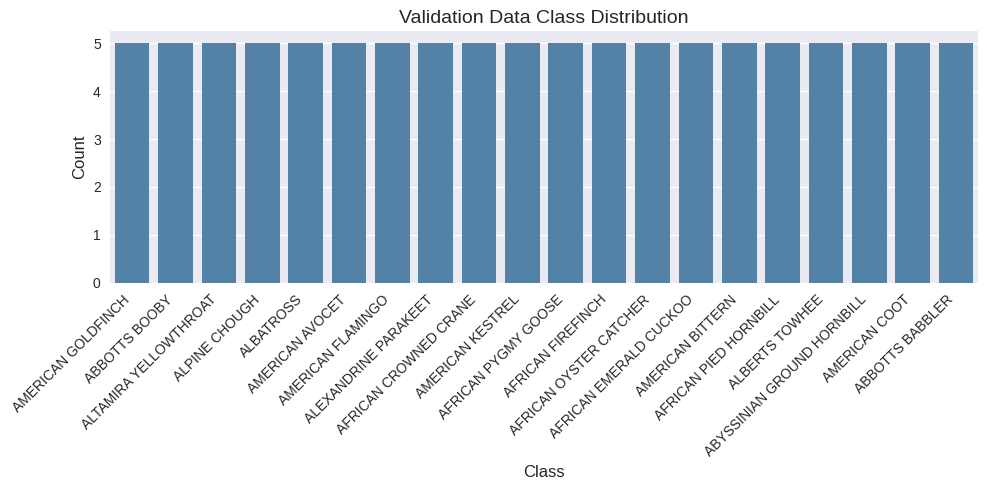

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

def plot_class_distribution(dataframe, title, class_map):
    """
    Plots the distribution of classes in a given DataFrame.

    Args:
        dataframe (pd.DataFrame): DataFrame with 'label' column representing the class labels.
        title (str): Title of the plot.
        class_map (dict): Dictionary mapping numeric labels to class names.
    """
    # Map numeric labels to class names for display
    inverted_class_map = {v: k for k, v in class_map.items()}
    dataframe['class_name'] = dataframe['label'].map(inverted_class_map)

    # Plot the class distribution
    plt.figure(figsize=(10, 5))
    sns.countplot(data=dataframe, x='class_name', color='steelblue')
    plt.title(title, fontsize=14)
    plt.xlabel('Class', fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.xticks(rotation=45, ha='right', fontsize=10)
    plt.yticks(fontsize=10)
    plt.tight_layout()
    plt.show()

# Plot class distributions for training and validation data
plot_class_distribution(train_df, "Training Data Class Distribution", train_class_map)
plot_class_distribution(val_df, "Validation Data Class Distribution", train_class_map)


## Dataset Preparation
Now we are going to build the dataset by using `Dataset` and `DataLoader` classes within PyTorch. I recommend you to randomly crop the images to (160, 160) and then normalize them.

In [ ]:
import cv2
import torch
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import pandas as pd

class BirdDataset(Dataset):
    def __init__(self, df, transform=None):
        """
        Custom dataset for bird images.

        Args:
            df (pd.DataFrame): DataFrame containing 'filepath' and 'label' columns.
            transform (callable, optional): Transformations to apply to the images.
        """
        self.df = df
        self.transform = transform

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        """
        Load and transform an image.

        Args:
            idx (int): Index of the sample to retrieve.

        Returns:
            torch.Tensor: Transformed image tensor.
            torch.Tensor: Label tensor.
        """
        # Load the image and label
        img_path = self.df.iloc[idx]['filepath']
        label = self.df.iloc[idx]['label']

        # Read and convert the image to RGB
        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

        # Apply transformations
        if self.transform:
            image = self.transform(image)

        return image, torch.tensor(label, dtype=torch.long)

# Define transformations
def get_transforms(is_train=True):
    """
    Returns a transformation pipeline based on the training or validation phase.

    Args:
        is_train (bool): Flag indicating if the transformations are for training or validation.

    Returns:
        transforms.Compose: Composed transformations.
    """
    if is_train:
        return transforms.Compose([
            transforms.ToPILImage(),
            transforms.RandomResizedCrop((160, 160)),  # Random crop
            transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),  # Augmentation
            transforms.RandomHorizontalFlip(),  # Augmentation
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize
        ])
    else:
        return transforms.Compose([
            transforms.ToPILImage(),
            transforms.Resize((160, 160)),  # Resize to consistent dimensions
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])  # Normalize
        ])

# Initialize datasets
train_dataset = BirdDataset(df=train_df, transform=get_transforms(is_train=True))
val_dataset = BirdDataset(df=val_df, transform=get_transforms(is_train=False))

# Initialize data loaders
def get_data_loader(dataset, batch_size=32, shuffle=False, num_workers=4):
    """
    Returns a DataLoader for the given dataset.

    Args:
        dataset (Dataset): The dataset to load.
        batch_size (int): Number of samples per batch.
        shuffle (bool): Whether to shuffle the data.
        num_workers (int): Number of worker threads for data loading.

    Returns:
        DataLoader: The DataLoader for the dataset.
    """
    return DataLoader(dataset, batch_size=batch_size, shuffle=shuffle, num_workers=num_workers)

train_loader = get_data_loader(train_dataset, batch_size=32, shuffle=True)
val_loader = get_data_loader(val_dataset, batch_size=32, shuffle=False)

# Verify the data loader
for images, labels in train_loader:
    print(f"Batch size: {images.shape}, Labels: {labels.shape}")
    break

# Print dataset sizes
print(f"Training dataset size: {len(train_dataset)}")
print(f"Validation dataset size: {len(val_dataset)}")

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:617: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(


Batch size: torch.Size([32, 3, 160, 160]), Labels: torch.Size([32])
Training dataset size: 3208
Validation dataset size: 100


**Why is data augmentation pivotal in training models for image tasks, and what techniques are beneficial for this particular assignment?**

Data augmentation is pivotal in training models for image tasks because it artificially increases the size and diversity of the dataset, helping models generalize better and reducing overfitting. For this assignment, beneficial techniques include:

1. **Random Cropping**: Ensures the model focuses on various parts of the image.
2. **Color Jittering**: Enhances robustness to brightness, contrast, and saturation variations.
3. **Horizontal Flipping**: Simulates real-world variations in image orientation.
4. **Rotation**: Adds variety by changing the orientation of objects.
5. **Normalization**: Standardizes pixel values to improve model convergence.

## Model Architecture
The model has an encoder block for encoding the grayscale image into a lower representation followed by a decoder block to generate the colorized image.

In [ ]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import models
import torch.optim as optim
from tqdm import tqdm

# Define the Squeeze-and-Excitation block
class SEBlock(nn.Module):
    """Squeeze-and-Excitation Block to recalibrate channel-wise feature responses"""
    def __init__(self, channels, reduction=16):
        super(SEBlock, self).__init__()
        self.squeeze = nn.AdaptiveAvgPool2d(1)  # Global average pooling to generate channel descriptors
        self.excitation = nn.Sequential(
            nn.Linear(channels, channels // reduction, bias=False),  # Reduce channels
            nn.ReLU(inplace=True),  # Non-linearity
            nn.Linear(channels // reduction, channels, bias=False),  # Restore original channels
            nn.Sigmoid()  # Scale between 0 and 1
        )

    def forward(self, x):
        b, c, _, _ = x.size()
        y = self.squeeze(x).view(b, c)  # Squeeze operation
        y = self.excitation(y).view(b, c, 1, 1)  # Excitation operation
        return x * y.expand_as(x)  # Scale input by the excitation weights

# Define the Residual Block with optional Squeeze-and-Excitation block
class ResidualBlock(nn.Module):
    """Residual Block with an optional Squeeze-and-Excitation mechanism"""
    def __init__(self, in_channels, out_channels, use_se=False):
        super(ResidualBlock, self).__init__()
        self.use_se = use_se
        self.conv1 = nn.Conv2d(in_channels, out_channels, kernel_size=3, stride=1, padding=1)
        self.gn1 = nn.GroupNorm(num_groups=8, num_channels=out_channels)  # Group normalization
        self.relu = nn.ReLU(inplace=True)
        self.conv2 = nn.Conv2d(out_channels, out_channels, kernel_size=3, stride=1, padding=1)
        self.gn2 = nn.GroupNorm(num_groups=8, num_channels=out_channels)
        if self.use_se:
            self.se = SEBlock(out_channels)  # Optional Squeeze-and-Excitation block
        if in_channels != out_channels:
            self.shortcut = nn.Sequential(
                nn.Conv2d(in_channels, out_channels, kernel_size=1, stride=1, padding=0),
                nn.GroupNorm(num_groups=8, num_channels=out_channels)
            )
        else:
            self.shortcut = nn.Identity()  # Identity mapping if no dimension change

    def forward(self, x):
        identity = self.shortcut(x)  # Shortcut connection
        out = self.conv1(x)
        out = self.gn1(out)
        out = self.relu(out)
        out = self.conv2(out)
        out = self.gn2(out)
        if self.use_se:
            out = self.se(out)  # Apply Squeeze-and-Excitation if enabled
        out += identity  # Add shortcut to the output
        out = self.relu(out)  # Final activation
        return out

# Define Perceptual Loss using VGG-19 as feature extractor
class PerceptualLoss(nn.Module):
    """Perceptual Loss using VGG-19 feature layers for content similarity"""
    def __init__(self, feature_layers=None, use_half=False):
        super(PerceptualLoss, self).__init__()
        self.use_half = use_half
        vgg = models.vgg19(pretrained=True).features  # Load pretrained VGG-19 features
        if feature_layers is None:
            feature_layers = [0, 5, 10, 19, 28]  # Default layers for perceptual comparison
        self.feature_layers = feature_layers
        self.layers = nn.ModuleList([vgg[i] for i in range(max(feature_layers) + 1)])
        for param in self.layers.parameters():
            param.requires_grad = False  # Freeze the feature extractor
        self.register_buffer('mean', torch.tensor([0.485, 0.456, 0.406]).view(1, 3, 1, 1))  # Normalize mean
        self.register_buffer('std', torch.tensor([0.229, 0.224, 0.225]).view(1, 3, 1, 1))  # Normalize std

    def forward(self, x, y):
        if self.use_half:
            x = x.half()
            y = y.half()
        x = (x - self.mean) / self.std  # Normalize input x
        y = (y - self.mean) / self.std  # Normalize input y
        loss = 0
        for i, layer in enumerate(self.layers):
            x = layer(x)
            y = layer(y)
            if i in self.feature_layers:
                loss += F.l1_loss(x, y)  # L1 loss between corresponding features
        return loss

# Define the Encoder for the Variational Autoencoder
class Encoder(nn.Module):
    """Encoder with Residual Blocks and optional Squeeze-and-Excitation"""
    def __init__(self, do_bn=False):
        super(Encoder, self).__init__()
        self.do_bn = do_bn
        self.block1 = self.inner_block(3, 64, use_se=True)
        self.block2 = self.inner_block(64, 128, use_se=True)
        self.block3 = self.inner_block(128, 256, use_se=True)
        self.block4 = self.inner_block(256, 512, use_se=True)
        self.flatten = nn.Flatten()
        self.fc_mu = nn.Linear(512 * 10 * 10, 128)  # Mean vector for latent representation
        self.fc_logvar = nn.Linear(512 * 10 * 10, 128)  # Log variance for latent representation

    def inner_block(self, in_c, out_c, maxpool=2, use_se=False):
        """Helper to create a Residual Block with optional max pooling"""
        layers = [
            ResidualBlock(in_c, out_c, use_se=use_se),
            nn.MaxPool2d(kernel_size=maxpool, stride=maxpool),  # Down-sampling
            nn.Dropout(0.1)  # Regularization
        ]
        return nn.Sequential(*layers)

    def forward(self, x):
        features = []  # Store intermediate features for skip connections
        x = self.block1(x); features.append(x)
        x = self.block2(x); features.append(x)
        x = self.block3(x); features.append(x)
        x = self.block4(x); features.append(x)
        x = self.flatten(x)  # Flatten spatial dimensions
        mu = self.fc_mu(x)  # Latent mean
        logvar = self.fc_logvar(x)  # Latent log variance
        return mu, logvar, features

# Define the Decoder for the Variational Autoencoder
class Decoder(nn.Module):
    """Decoder to reconstruct images from latent representations"""
    def __init__(self, do_bn):
        super(Decoder, self).__init__()
        self.do_bn = do_bn
        self.fc = nn.Linear(128, 512 * 10 * 10)  # Fully connected layer to expand latent space
        self.up1 = self.inner_block(512, 256)
        self.up2 = self.inner_block(256 + 256, 128)
        self.up3 = self.inner_block(128 + 128, 64)
        self.up4 = self.inner_block(64 + 64, 32, out=True)
        self.conv_final = nn.Conv2d(32, 3, kernel_size=3, stride=1, padding=1)  # Final convolution
        self.sigmoid = nn.Sigmoid()  # Normalize output to [0, 1]

    def inner_block(self, in_c, out_c, out=False):
        """Helper to create upsampling blocks"""
        layers = [
            nn.ConvTranspose2d(in_c, out_c, kernel_size=2, stride=2),  # Upsampling
            nn.GroupNorm(num_groups=8, num_channels=out_c),  # Group normalization
            nn.ReLU(inplace=True)  # Activation
        ]
        return nn.Sequential(*layers)

    def forward(self, z, skip_features):
        h = self.fc(z)  # Map latent space to feature space
        h = h.view(h.size(0), 512, 10, 10)  # Reshape to spatial dimensions
        h = self.up1(h)
        h = torch.cat([h, skip_features[2]], dim=1)  # Concatenate skip connections
        h = self.up2(h)
        h = torch.cat([h, skip_features[1]], dim=1)
        h = self.up3(h)
        h = torch.cat([h, skip_features[0]], dim=1)
        h = self.up4(h)
        h = self.conv_final(h)
        h = self.sigmoid(h)  # Normalize reconstructed output
        return h

# Define the full Variational Autoencoder network
class Net(nn.Module):
    """Variational Autoencoder with Perceptual Loss"""
    def __init__(self):
        super(Net, self).__init__()
        self.encoder = Encoder(do_bn=True)  # Encoder module
        self.decoder = Decoder(do_bn=True)  # Decoder module
        self.perceptual_loss = PerceptualLoss(feature_layers=[0, 5, 10, 19, 28])  # Perceptual loss
        self.optim = optim.Adam(self.parameters(), lr=1e-4)  # Adam optimizer

    def reparameterize(self, mu, logvar):
        """Reparameterization trick to sample from N(mu, var)"""
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def forward(self, x):
        mu, logvar, skip_features = self.encoder(x)  # Encode input
        z = self.reparameterize(mu, logvar)  # Sample latent space
        recon = self.decoder(z, skip_features)  # Decode to reconstruct
        return recon, mu, logvar

    def compute_loss(self, pred, target, mu, logvar):
        """Compute the total loss for the VAE"""
        mse_loss = F.mse_loss(pred, target)  # Reconstruction loss
        perceptual = self.perceptual_loss(pred, target)  # Perceptual loss
        kld_loss = -0.5 * torch.mean(1 + logvar - mu.pow(2) - logvar.exp())  # KL divergence
        total_loss = mse_loss + 0.01 * perceptual + 0.001 * kld_loss  # Weighted sum of losses
        return total_loss, mse_loss, perceptual, kld_loss

    def training_step(self, images):
        """Perform a single training step"""
        self.optim.zero_grad()
        recon, mu, logvar = self.forward(images)  # Forward pass
        total_loss, mse_loss, perceptual_loss, kld_loss = self.compute_loss(recon, images, mu, logvar)
        total_loss.backward()  # Backpropagation
        self.optim.step()  # Update weights
        return total_loss.item()

    def validation_step(self, images):
        """Perform a single validation step"""
        self.eval()
        with torch.no_grad():
            recon, mu, logvar = self.forward(images)  # Forward pass
            total_loss, mse_loss, perceptual_loss, kld_loss = self.compute_loss(recon, images, mu, logvar)
        return total_loss.item()

    def train_model(self, train_loader, val_loader, epochs=10, device='cuda'):
        """Train the VAE model"""
        self.to(device)  # Move model to device
        train_loss_history, val_loss_history = [], []

        for epoch in range(epochs):
            train_losses = self._run_epoch(train_loader, is_training=True, device=device, desc=f"Epoch {epoch + 1}/{epochs} [Train]")
            val_losses = self._run_epoch(val_loader, is_training=False, device=device, desc=f"Epoch {epoch + 1}/{epochs} [Val]")
            train_loss, val_loss = sum(train_losses) / len(train_losses), sum(val_losses) / len(val_losses)
            train_loss_history.append(train_loss)
            val_loss_history.append(val_loss)
            print(f"Epoch {epoch + 1}/{epochs}: Train Loss: {train_loss:.4f}, Val Loss: {val_loss:.4f}")

        return train_loss_history, val_loss_history

    def _run_epoch(self, loader, is_training, device, desc):
        """Run a single epoch for training or validation"""
        self.train() if is_training else self.eval()
        losses = []
        for batch in tqdm(loader, desc=desc):
            images, _ = batch
            images = images.to(device)
            if is_training:
                loss = self.training_step(images)
            else:
                loss = self.validation_step(images)
            losses.append(loss)
        return losses


In [ ]:
model = Net()
print(model)

Net(
  (encoder): Encoder(
    (block1): Sequential(
      (0): ResidualBlock(
        (conv1): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (gn1): GroupNorm(8, 64, eps=1e-05, affine=True)
        (relu): ReLU(inplace=True)
        (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (gn2): GroupNorm(8, 64, eps=1e-05, affine=True)
        (se): SEBlock(
          (squeeze): AdaptiveAvgPool2d(output_size=1)
          (excitation): Sequential(
            (0): Linear(in_features=64, out_features=4, bias=False)
            (1): ReLU(inplace=True)
            (2): Linear(in_features=4, out_features=64, bias=False)
            (3): Sigmoid()
          )
        )
        (shortcut): Sequential(
          (0): Conv2d(3, 64, kernel_size=(1, 1), stride=(1, 1))
          (1): GroupNorm(8, 64, eps=1e-05, affine=True)
        )
      )
      (1): MaxPool2d(kernel_size=2, stride=2, padding=0, dilation=1, ceil_mode=False)
      (2): Dropout(

## Training Phase

In [ ]:
from tqdm.notebook import tqdm

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

model = Net().to(device)

train_loss_history, val_loss_history = model.train_model(train_loader=train_loader, val_loader=val_loader, epochs=50)

Epoch 1/50 [Train]:   0%|          | 0/101 [00:00<?, ?it/s]

Epoch 1/50 [Val]:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch 1/50: Train Loss: 1.8496, Val Loss: 1.5749


Epoch 2/50 [Train]:   0%|          | 0/101 [00:00<?, ?it/s]

Epoch 2/50 [Val]:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch 2/50: Train Loss: 1.4589, Val Loss: 1.4071


Epoch 3/50 [Train]:   0%|          | 0/101 [00:00<?, ?it/s]

Epoch 3/50 [Val]:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch 3/50: Train Loss: 1.3588, Val Loss: 1.3446


Epoch 4/50 [Train]:   0%|          | 0/101 [00:00<?, ?it/s]

Epoch 4/50 [Val]:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch 4/50: Train Loss: 1.3104, Val Loss: 1.3150


Epoch 5/50 [Train]:   0%|          | 0/101 [00:00<?, ?it/s]

Epoch 5/50 [Val]:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch 5/50: Train Loss: 1.2890, Val Loss: 1.2969


Epoch 6/50 [Train]:   0%|          | 0/101 [00:00<?, ?it/s]

Epoch 6/50 [Val]:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch 6/50: Train Loss: 1.2809, Val Loss: 1.2836


Epoch 7/50 [Train]:   0%|          | 0/101 [00:00<?, ?it/s]

Epoch 7/50 [Val]:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch 7/50: Train Loss: 1.2814, Val Loss: 1.2751


Epoch 8/50 [Train]:   0%|          | 0/101 [00:00<?, ?it/s]

Epoch 8/50 [Val]:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch 8/50: Train Loss: 1.2605, Val Loss: 1.2680


Epoch 9/50 [Train]:   0%|          | 0/101 [00:00<?, ?it/s]

Epoch 9/50 [Val]:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch 9/50: Train Loss: 1.2626, Val Loss: 1.2632


Epoch 10/50 [Train]:   0%|          | 0/101 [00:00<?, ?it/s]

Epoch 10/50 [Val]:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch 10/50: Train Loss: 1.2444, Val Loss: 1.2592


Epoch 11/50 [Train]:   0%|          | 0/101 [00:00<?, ?it/s]

Epoch 11/50 [Val]:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch 11/50: Train Loss: 1.2493, Val Loss: 1.2554


Epoch 12/50 [Train]:   0%|          | 0/101 [00:00<?, ?it/s]

Epoch 12/50 [Val]:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch 12/50: Train Loss: 1.2523, Val Loss: 1.2519


Epoch 13/50 [Train]:   0%|          | 0/101 [00:00<?, ?it/s]

Epoch 13/50 [Val]:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch 13/50: Train Loss: 1.2510, Val Loss: 1.2489


Epoch 14/50 [Train]:   0%|          | 0/101 [00:00<?, ?it/s]

Epoch 14/50 [Val]:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch 14/50: Train Loss: 1.2369, Val Loss: 1.2466


Epoch 15/50 [Train]:   0%|          | 0/101 [00:00<?, ?it/s]

Epoch 15/50 [Val]:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch 15/50: Train Loss: 1.2377, Val Loss: 1.2440


Epoch 16/50 [Train]:   0%|          | 0/101 [00:00<?, ?it/s]

Epoch 16/50 [Val]:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch 16/50: Train Loss: 1.2416, Val Loss: 1.2422


Epoch 17/50 [Train]:   0%|          | 0/101 [00:00<?, ?it/s]

Epoch 17/50 [Val]:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch 17/50: Train Loss: 1.2314, Val Loss: 1.2400


Epoch 18/50 [Train]:   0%|          | 0/101 [00:00<?, ?it/s]

Epoch 18/50 [Val]:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch 18/50: Train Loss: 1.2378, Val Loss: 1.2384


Epoch 19/50 [Train]:   0%|          | 0/101 [00:00<?, ?it/s]

Epoch 19/50 [Val]:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch 19/50: Train Loss: 1.2331, Val Loss: 1.2370


Epoch 20/50 [Train]:   0%|          | 0/101 [00:00<?, ?it/s]

Epoch 20/50 [Val]:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch 20/50: Train Loss: 1.2338, Val Loss: 1.2350


Epoch 21/50 [Train]:   0%|          | 0/101 [00:00<?, ?it/s]

Epoch 21/50 [Val]:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch 21/50: Train Loss: 1.2375, Val Loss: 1.2336


Epoch 22/50 [Train]:   0%|          | 0/101 [00:00<?, ?it/s]

Epoch 22/50 [Val]:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch 22/50: Train Loss: 1.2295, Val Loss: 1.2327


Epoch 23/50 [Train]:   0%|          | 0/101 [00:00<?, ?it/s]

Epoch 23/50 [Val]:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch 23/50: Train Loss: 1.2334, Val Loss: 1.2306


Epoch 24/50 [Train]:   0%|          | 0/101 [00:00<?, ?it/s]

Epoch 24/50 [Val]:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch 24/50: Train Loss: 1.2241, Val Loss: 1.2299


Epoch 25/50 [Train]:   0%|          | 0/101 [00:00<?, ?it/s]

Epoch 25/50 [Val]:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch 25/50: Train Loss: 1.2261, Val Loss: 1.2279


Epoch 26/50 [Train]:   0%|          | 0/101 [00:00<?, ?it/s]

Epoch 26/50 [Val]:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch 26/50: Train Loss: 1.2284, Val Loss: 1.2276


Epoch 27/50 [Train]:   0%|          | 0/101 [00:00<?, ?it/s]

Epoch 27/50 [Val]:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch 27/50: Train Loss: 1.2222, Val Loss: 1.2257


Epoch 28/50 [Train]:   0%|          | 0/101 [00:00<?, ?it/s]

Epoch 28/50 [Val]:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch 28/50: Train Loss: 1.2232, Val Loss: 1.2250


Epoch 29/50 [Train]:   0%|          | 0/101 [00:00<?, ?it/s]

Epoch 29/50 [Val]:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch 29/50: Train Loss: 1.2175, Val Loss: 1.2248


Epoch 30/50 [Train]:   0%|          | 0/101 [00:00<?, ?it/s]

Epoch 30/50 [Val]:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch 30/50: Train Loss: 1.2361, Val Loss: 1.2225


Epoch 31/50 [Train]:   0%|          | 0/101 [00:00<?, ?it/s]

Epoch 31/50 [Val]:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch 31/50: Train Loss: 1.2241, Val Loss: 1.2219


Epoch 32/50 [Train]:   0%|          | 0/101 [00:00<?, ?it/s]

Epoch 32/50 [Val]:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch 32/50: Train Loss: 1.2226, Val Loss: 1.2209


Epoch 33/50 [Train]:   0%|          | 0/101 [00:00<?, ?it/s]

Epoch 33/50 [Val]:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch 33/50: Train Loss: 1.2231, Val Loss: 1.2201


Epoch 34/50 [Train]:   0%|          | 0/101 [00:00<?, ?it/s]

Epoch 34/50 [Val]:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch 34/50: Train Loss: 1.2175, Val Loss: 1.2190


Epoch 35/50 [Train]:   0%|          | 0/101 [00:00<?, ?it/s]

Epoch 35/50 [Val]:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch 35/50: Train Loss: 1.2211, Val Loss: 1.2184


Epoch 36/50 [Train]:   0%|          | 0/101 [00:00<?, ?it/s]

Epoch 36/50 [Val]:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch 36/50: Train Loss: 1.2193, Val Loss: 1.2178


Epoch 37/50 [Train]:   0%|          | 0/101 [00:00<?, ?it/s]

Epoch 37/50 [Val]:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch 37/50: Train Loss: 1.2148, Val Loss: 1.2162


Epoch 38/50 [Train]:   0%|          | 0/101 [00:00<?, ?it/s]

Epoch 38/50 [Val]:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch 38/50: Train Loss: 1.2242, Val Loss: 1.2161


Epoch 39/50 [Train]:   0%|          | 0/101 [00:00<?, ?it/s]

Epoch 39/50 [Val]:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch 39/50: Train Loss: 1.2047, Val Loss: 1.2155


Epoch 40/50 [Train]:   0%|          | 0/101 [00:00<?, ?it/s]

Epoch 40/50 [Val]:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch 40/50: Train Loss: 1.2189, Val Loss: 1.2142


Epoch 41/50 [Train]:   0%|          | 0/101 [00:00<?, ?it/s]

Epoch 41/50 [Val]:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch 41/50: Train Loss: 1.2276, Val Loss: 1.2143


Epoch 42/50 [Train]:   0%|          | 0/101 [00:00<?, ?it/s]

Epoch 42/50 [Val]:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch 42/50: Train Loss: 1.2119, Val Loss: 1.2135


Epoch 43/50 [Train]:   0%|          | 0/101 [00:00<?, ?it/s]

Epoch 43/50 [Val]:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch 43/50: Train Loss: 1.2206, Val Loss: 1.2121


Epoch 44/50 [Train]:   0%|          | 0/101 [00:00<?, ?it/s]

Epoch 44/50 [Val]:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch 44/50: Train Loss: 1.2202, Val Loss: 1.2117


Epoch 45/50 [Train]:   0%|          | 0/101 [00:00<?, ?it/s]

Epoch 45/50 [Val]:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch 45/50: Train Loss: 1.2132, Val Loss: 1.2107


Epoch 46/50 [Train]:   0%|          | 0/101 [00:00<?, ?it/s]

Epoch 46/50 [Val]:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch 46/50: Train Loss: 1.2152, Val Loss: 1.2106


Epoch 47/50 [Train]:   0%|          | 0/101 [00:00<?, ?it/s]

Epoch 47/50 [Val]:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch 47/50: Train Loss: 1.2130, Val Loss: 1.2097


Epoch 48/50 [Train]:   0%|          | 0/101 [00:00<?, ?it/s]

Epoch 48/50 [Val]:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch 48/50: Train Loss: 1.2076, Val Loss: 1.2091


Epoch 49/50 [Train]:   0%|          | 0/101 [00:00<?, ?it/s]

Epoch 49/50 [Val]:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch 49/50: Train Loss: 1.2048, Val Loss: 1.2086


Epoch 50/50 [Train]:   0%|          | 0/101 [00:00<?, ?it/s]

Epoch 50/50 [Val]:   0%|          | 0/4 [00:00<?, ?it/s]

Epoch 50/50: Train Loss: 1.2162, Val Loss: 1.2078


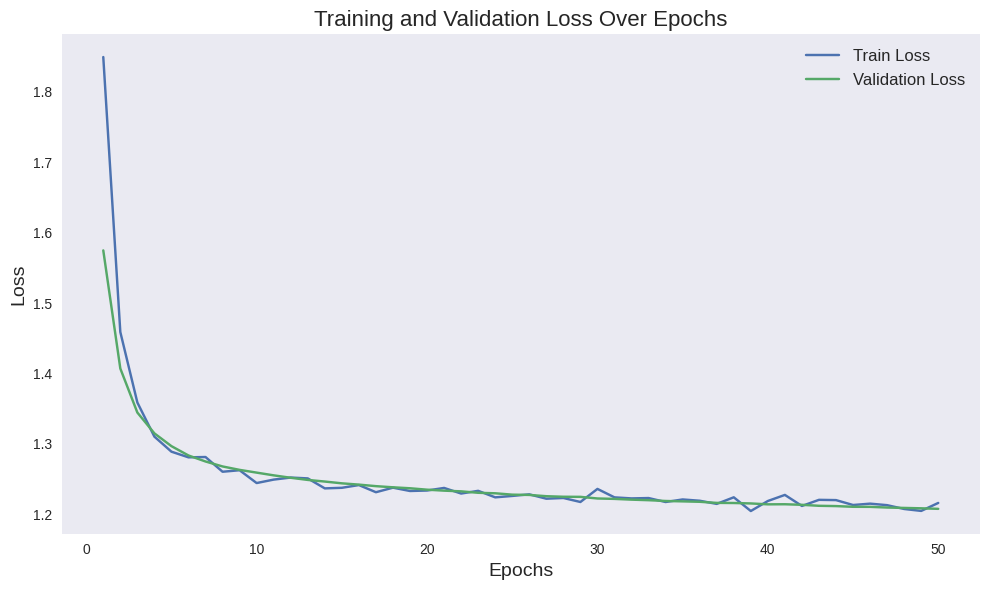

In [ ]:
# Plot training and validation loss
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 6))
plt.plot(range(1, epochs + 1), train_loss_history, label='Train Loss')
plt.plot(range(1, epochs + 1), val_loss_history, label='Validation Loss')
plt.xlabel('Epochs', fontsize=14)
plt.ylabel('Loss', fontsize=14)
plt.title('Training and Validation Loss Over Epochs', fontsize=16)
plt.legend(fontsize=12)
plt.grid()
plt.tight_layout()
plt.show()

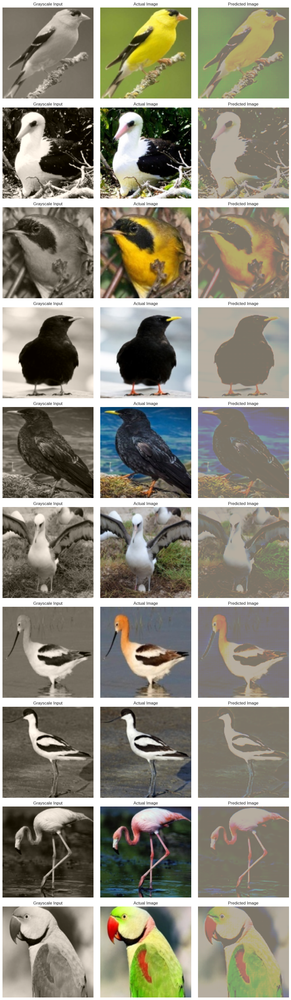

In [ ]:
import matplotlib.pyplot as plt
import torch

def unnormalize(tensor, mean, std):
    """
    Unnormalize a tensor using the provided mean and standard deviation.

    Args:
        tensor: Torch tensor to be unnormalized.
        mean: Mean used during normalization.
        std: Standard deviation used during normalization.

    Returns:
        Unnormalized tensor.
    """
    mean = torch.tensor(mean).view(-1, 1, 1)
    std = torch.tensor(std).view(-1, 1, 1)
    return tensor * std + mean


def plot_image_row(axes, row, gray_img, actual_img, pred_img):
    """
    Plots a single row of images: grayscale input, actual image, and predicted image.

    Args:
        axes: Matplotlib axes to plot on.
        row: Row index to plot the images.
        gray_img: Grayscale input image.
        actual_img: Ground truth image.
        pred_img: Predicted image.
    """
    axes[row, 0].imshow(gray_img.clip(0, 1))
    axes[row, 0].set_title("Grayscale Input")
    axes[row, 0].axis('off')

    axes[row, 1].imshow(actual_img.clip(0, 1))
    axes[row, 1].set_title("Actual Image")
    axes[row, 1].axis('off')

    axes[row, 2].imshow(pred_img.clip(0, 1))
    axes[row, 2].set_title("Predicted Image")
    axes[row, 2].axis('off')


def show_images(model, data_loader, device='cuda', num_samples=10):
    """
    Visualizes grayscale input, actual, and predicted images.

    Args:
        model: Trained model to make predictions.
        data_loader: DataLoader containing the dataset.
        device: Device to run the model on ('cuda' or 'cpu').
        num_samples: Number of images to visualize.
    """
    model.eval()  # Set model to evaluation mode
    model.to(device)

    # Retrieve a batch of images
    batch = next(iter(data_loader))
    images, _ = batch
    images = images.to(device)

    # Generate predictions
    with torch.no_grad():
        recon, _, _ = model(images)

    # Move images and predictions back to the CPU for visualization
    images = images.cpu()
    recon = recon.cpu()

    # Define normalization parameters
    mean = [0.485, 0.456, 0.406]
    std = [0.229, 0.224, 0.225]

    # Create a figure for visualization
    fig, axes = plt.subplots(nrows=num_samples, ncols=3, figsize=(12, 4 * num_samples))

    for i in range(num_samples):
        # Unnormalize images
        actual_img = unnormalize(images[i], mean, std).permute(1, 2, 0).numpy()
        pred_img = unnormalize(recon[i], mean, std).permute(1, 2, 0).numpy()

        # Convert grayscale input to 3 channels for visualization
        gray_img = images[i].mean(dim=0, keepdim=True)  # Single channel
        gray_3ch = torch.cat([gray_img, gray_img, gray_img], dim=0)  # Convert to 3 channels
        gray_3ch = unnormalize(gray_3ch, mean, std).permute(1, 2, 0).numpy()

        # Plot the row of images
        plot_image_row(axes, i, gray_3ch, actual_img, pred_img)

    plt.tight_layout()
    plt.show()


# Usage Example
show_images(model, val_loader, device=device, num_samples=10)


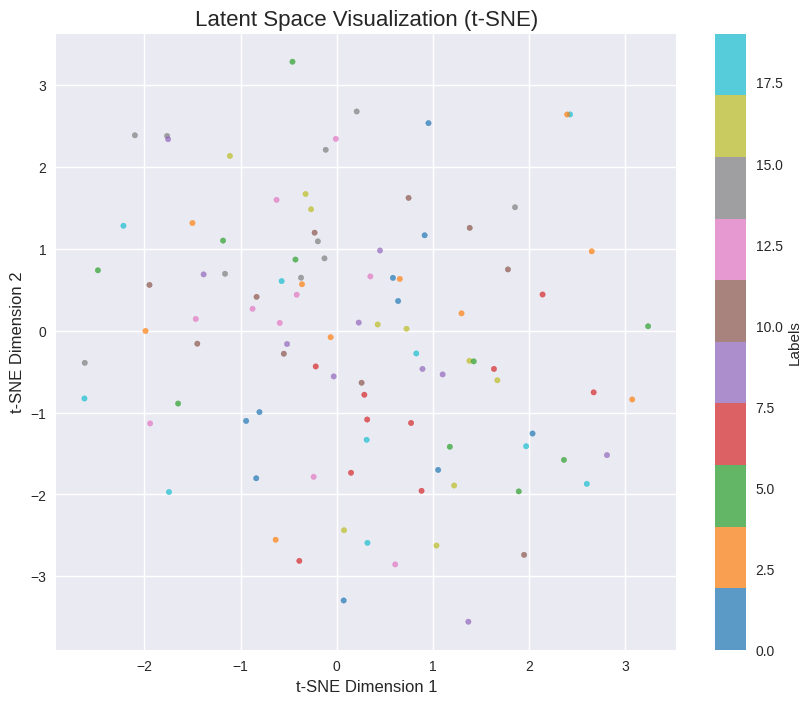

In [ ]:
import matplotlib.pyplot as plt
from sklearn.manifold import TSNE
import torch

def visualize_latent_space(encoder, data_loader, device='cuda', num_samples=1000):
    """
    Visualizes the latent space of the encoded images using t-SNE.

    Parameters:
    - encoder (torch.nn.Module): The encoder model component of the VAE.
    - data_loader (torch.utils.data.DataLoader): DataLoader containing the data to be visualized.
    - device (str): The device to run the encoder on ('cuda' or 'cpu').
    - num_samples (int): Maximum number of samples to include in the visualization.
    """
    encoder.eval()  # Set encoder to evaluation mode
    encoder.to(device)  # Move encoder to the correct device

    latent_vectors = []  # To store latent representations
    labels = []  # To store labels for visualization

    # Collect latent representations from the data loader
    with torch.no_grad():
        for batch in data_loader:
            images, batch_labels = batch
            images = images.to(device)

            # Get latent mean (mu) from the encoder
            mu, _, _ = encoder(images)  # Use encoder to extract latent space
            latent_vectors.append(mu.cpu())  # Move to CPU for stacking
            labels.extend(batch_labels.cpu().numpy())  # Collect labels

            # Stop if we've collected enough samples
            if len(labels) >= num_samples:
                break

    # Stack latent vectors into a single matrix
    latent_vectors = torch.cat(latent_vectors, dim=0)[:num_samples]
    labels = labels[:num_samples]

    # Apply t-SNE to reduce latent space to 2D
    tsne = TSNE(n_components=2, random_state=42)
    latent_2d = tsne.fit_transform(latent_vectors.numpy())

    # Plot the reduced 2D latent space
    plt.figure(figsize=(10, 8))
    scatter = plt.scatter(latent_2d[:, 0], latent_2d[:, 1], c=labels, cmap='tab10', s=15, alpha=0.7)
    plt.colorbar(scatter, label="Labels")
    plt.title("Latent Space Visualization (t-SNE)", fontsize=16)
    plt.xlabel("t-SNE Dimension 1", fontsize=12)
    plt.ylabel("t-SNE Dimension 2", fontsize=12)
    plt.grid(True)
    plt.show()


# Example Usage
# Assuming `model` is your VAE and `val_loader` is your validation DataLoader
visualize_latent_space(encoder=model.encoder, data_loader=val_loader, device=device, num_samples=1000)


How the distribution of points in the latent space reflects the VAE's capability to generalize grayscale images into colored outputs.

1. **Clustering and Class Representation**:
    - Can you identify clusters in the latent space that correspond to specific image features or categories?
    - How do these clusters inform us about the VAE's ability to differentiate between various input characteristics related to color information?

2. **Continuity and Transitions**:
    - Analyze whether neighboring points in the latent space result in similar or different color outputs. What does this continuity suggest about the latent representation's smoothness?
    - How could these visual transitions impact the quality and realism of the generated colorations, especially for input images that exhibit gradual changes (e.g., transitions in lighting or shading)?

3. **Effectiveness of Dimensionality Reduction**:
    - Assess the effectiveness of t-SNE in projecting high-dimensional latent vectors into a comprehensible 2D representation. What limitations might exist, and how do they affect your interpretation?


### **Answers to the previous questions are here:**

1. **Clustering and Class Representation**:
   - Distinct clusters indicate the VAE effectively captures and encodes specific color-related features or categories, reflecting its ability to generalize grayscale inputs into meaningful color mappings.

2. **Continuity and Transitions**:
   - Smooth transitions between neighboring points suggest the latent space encodes continuous variations in color. This smoothness enhances the realism of generated outputs, especially for gradual changes like lighting or shading.

3. **Effectiveness of Dimensionality Reduction**:
   - t-SNE effectively visualizes clusters in 2D but may distort distances and neighborhood relationships due to its non-linear nature, limiting precise interpretation of global latent space structure.

Elaborate on how the encoder-decoder architecture facilitates the learning of complex data distributions in image colorization. How does this architecture differ from a simple autoencoder?

ANSWER:

The **encoder-decoder architecture** learns complex data distributions by compressing grayscale inputs into a latent space that captures global context and semantic features (encoder) and reconstructing colorized outputs using spatial alignment and upsampling (decoder). Unlike a simple autoencoder, it focuses on input-to-output transformations (e.g., grayscale to color), leveraging contextual understanding and flexible decoding for accurate and coherent colorization.

Analyze the role of perceptual loss in enhancing the quality of colorized images. How does perceptual loss measure image similarity compared to pixel-wise losses like Mean Squared Error (MSE)?

Answer:

**Perceptual loss** enhances colorization quality by comparing high-level feature representations, capturing semantic similarities instead of pixel-by-pixel differences. Unlike **MSE**, which measures exact pixel similarity and can lead to blurry outputs, perceptual loss focuses on structural and contextual alignment, resulting in sharper and more realistic images.

Discuss how the latent space in a VAE impacts the fidelity and diversity of generated color images. What effects could varying the dimensionality of the latent space have?

Answer:

The **latent space** in a VAE governs the balance between fidelity and diversity of colorized images. A well-structured latent space ensures realistic outputs by encoding meaningful features while enabling diverse color variations.

- **Higher Dimensionality**: Increases diversity but risks overfitting and poor generalization.
- **Lower Dimensionality**: Improves fidelity by enforcing smoother representations but may reduce color diversity or fail to capture complex features.


# Image Segmentation with U-Net
Image segmentation is a crucial task in computer vision aimed at dividing an image into meaningful segments or objects. The U-Net architecture, famed for its utility in medical imaging, excels at this by leveraging its encoder-decoder structure, which efficiently learns and reconstructs image details. In this task, the U-Net is trained on pairs of images and masks, enabling it to delineate object boundaries at the pixel level with high precision. The training process involves preprocessing the data, adjusting network parameters, and evaluating the model using metrics like Intersection over Union (IoU) to ensure effective segmentation. Successful implementation of U-Net for this purpose can revolutionize applications in areas like autonomous vehicles, medical diagnosis, and agricultural monitoring.

Dataset: https://drive.google.com/drive/folders/1g97fGNQ6buixT8Hp96QyEYOMNKby5Oe8?usp=sharing

## Importing necessary libraries

In [2]:
# import system libs
import os
import time
import glob
import shutil

# import data handling tools
import cv2
import PIL
import numpy as np
import pandas as pd
import seaborn as sns
from PIL import Image
sns.set_style('darkgrid')
import matplotlib.pyplot as plt
# import necessary PyTorch libraries
...
print ('modules loaded')

modules loaded


## Load the Dataset

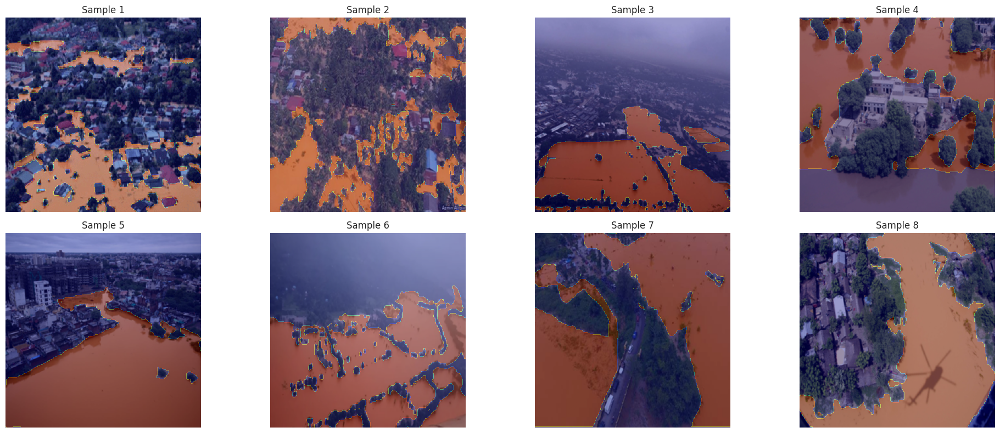

In [26]:
import os
import glob
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image

def create_data(image_dir, mask_dir):
    """
    Traverse through the given data directory to extract and return paths to images and masks.
    - Identify relevant folders for images and masks.
    - Collect file paths from these folders and return them as lists.
    """
    image_files = [os.path.join(image_dir, f) for f in sorted(os.listdir(image_dir)) if f.endswith(('.jpg', '.png'))]
    mask_files = [os.path.join(mask_dir, f) for f in sorted(os.listdir(mask_dir)) if f.endswith(('.jpg', '.png'))]
    return image_files, mask_files

SIZE = 256

def load_image(image_path, SIZE):
    """
    Load and resize an individual image to the specified size, scaling pixel values appropriately.
    """
    image = Image.open(image_path)
    image = image.resize((SIZE, SIZE))
    if image.mode != 'RGB':
        image = image.convert('RGB')
    image = np.asarray(image, dtype=np.float32) / 255.0
    return image

def load_images(image_paths, SIZE, mask=False):
    """
    Batch process a list of image paths.
    """
    data = []
    for path in image_paths:
        img = load_image(path, SIZE)
        if mask:
            if img.ndim == 3:
                img = img[..., 0]  # Extract a single channel
            img = np.round(img).astype(np.uint8)
        data.append(img)
    return np.stack(data)

def show_image(image, title=None, cmap=None, alpha=1):
    """
    Display a single image using matplotlib with options for color map and transparency.
    - Ensure axes are turned off for a cleaner display.
    - Include optional title for context.
    """
    plt.figure(figsize=(5, 5))
    plt.imshow(image, cmap=cmap, alpha=alpha)
    if title:
        plt.title(title, fontsize=12)
    plt.axis('off')
    plt.show()

def show_mask(image, mask, cmap=None, alpha=0.4):
    """
    Overlay a mask on an image to visualize segmentation results.
    - Use transparency to allow both mask and image to be visible.
    - Include color mapping to differentiate mask areas.
    """
    fig, ax = plt.subplots(figsize=(5, 5))
    ax.imshow(image, alpha=1.0)
    ax.imshow(mask, cmap=cmap, alpha=alpha)
    ax.axis('off')
    plt.show()

def show_images(images, masks, alpha=0.4, cmap='jet', num_samples=10):
    """
    Display multiple images with their corresponding masks overlaid.

    Args:
        images (np.array): Array of images (H, W, C).
        masks (np.array): Array of masks (H, W) or (H, W, 1).
        alpha (float): Transparency for mask overlay.
        cmap (str): Colormap for the mask overlay.
        num_samples (int): Number of image-mask pairs to visualize.
    """
    num_samples = min(num_samples, len(images), len(masks))
    fig, axes = plt.subplots(2, num_samples // 2, figsize=(20, 8))
    axes = axes.flatten()
    for i in range(num_samples):
        axes[i].imshow(images[i])
        axes[i].imshow(masks[i], cmap=cmap, alpha=alpha)
        axes[i].axis('off')
        axes[i].set_title(f"Sample {i+1}")
    plt.tight_layout()
    plt.show()

image_path = '/content/drive/MyDrive/segmentation/Image'
mask_path = '/content/drive/MyDrive/segmentation/Mask'

image_paths, mask_paths = create_data(image_path, mask_path)
images = load_images(image_paths, SIZE)
masks = load_images(mask_paths, SIZE, mask=True)
show_images(images[:8], masks[:8])


## The Architecture
In addition to U-Net, we are going to utilize Attention Gates.
You probably need to read this paper: https://arxiv.org/pdf/1804.03999v3

In [27]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, random_split
from tqdm import tqdm
import numpy as np

########################################
# Model Components
########################################

class conv_block(nn.Module):
    """
    A convolutional block that consists of:
    - Two sequential convolutional layers, each followed by batch normalization and ReLU activation.
    - An optional dropout layer after the second convolution.
    - An optional max pooling operation to reduce spatial dimensions.

    This block is often used in the encoder part of a U-Net architecture to progressively
    reduce the spatial dimensions while increasing the feature depth.
    """
    def __init__(self, in_ch=3, n_filters=32, dropout_prob=0, max_pooling=True):
        super(conv_block, self).__init__()
        self.max_pooling = max_pooling
        # Convolutional layers, normalization, activation, and optional dropout
        self.conv_sequence = nn.Sequential(
            nn.Conv2d(in_ch, n_filters, kernel_size=3, padding=1),
            nn.BatchNorm2d(n_filters),
            nn.ReLU(inplace=True),
            nn.Conv2d(n_filters, n_filters, kernel_size=3, padding=1),
            nn.BatchNorm2d(n_filters),
            nn.ReLU(inplace=True),
            nn.Dropout(p=dropout_prob)
        )
        # Max pooling layer to reduce spatial resolution by a factor of 2
        # If max_pooling=False, we simply pass the output unchanged (Identity)
        self.pool = nn.MaxPool2d(kernel_size=2, stride=2) if max_pooling else nn.Identity()

    def forward(self, x):
        # Pass input through the sequence of convolutions
        conv_out = self.conv_sequence(x)
        # Apply pooling (or identity) to get the pooled output
        pooled = self.pool(conv_out)
        # Return the pooled output and the feature map before pooling (useful for U-Net skip connections)
        return pooled, conv_out


class upsampling_block(nn.Module):
    """
    An upsampling block that takes:
    - An 'expansive_input' feature map (from the decoder) that needs to be upsampled.
    - A 'contractive_input' skip connection from the encoder with matching spatial dimensions.

    This block:
    - Upsamples the 'expansive_input' using a transposed convolution.
    - Concatenates the upsampled feature map with the corresponding skip connection feature map.
    - Processes the concatenated features through two convolutional layers with batch normalization and ReLU.

    This corresponds to the decoder step in a U-Net, where feature maps are merged with high-resolution features from the encoder.
    """
    def __init__(self, in_ch, skip_ch, n_filters=32):
        super(upsampling_block, self).__init__()
        # Transposed convolution to upsample the feature map by a factor of 2
        self.up_transpose = nn.ConvTranspose2d(in_ch, n_filters, kernel_size=2, stride=2)
        # Two convolutional layers after concatenation of upsampled features and skip connection
        self.conv_sequence = nn.Sequential(
            nn.Conv2d(n_filters + skip_ch, n_filters, kernel_size=3, padding=1),
            nn.BatchNorm2d(n_filters),
            nn.ReLU(inplace=True),
            nn.Conv2d(n_filters, n_filters, kernel_size=3, padding=1),
            nn.BatchNorm2d(n_filters),
            nn.ReLU(inplace=True)
        )

    def forward(self, expansive_input, contractive_input):
        # Upsample the input feature map
        upsampled = self.up_transpose(expansive_input)

        # Handle potential size mismatches between 'contractive_input' and 'upsampled'
        # Sometimes, due to integer division in pooling layers, dimensions may not match perfectly.
        diffY = contractive_input.size(2) - upsampled.size(2)
        diffX = contractive_input.size(3) - upsampled.size(3)
        # Pad the upsampled feature map to match the size of the contractive_input
        upsampled = F.pad(upsampled, [diffX // 2, diffX - diffX // 2,
                                      diffY // 2, diffY - diffY // 2])

        # Concatenate the skip connection feature map (from encoder) with the upsampled feature map
        concatenated = torch.cat([contractive_input, upsampled], dim=1)
        # Pass through the convolutional layers
        return self.conv_sequence(concatenated)


class CompleteAttentionBlock(nn.Module):
    """
    An attention block that refines the skip connection before it is concatenated in the decoder.

    The idea is:
    - Project both the encoder feature ('x') and the decoder feature ('g') into a lower-dimensional space.
    - Add them and apply non-linearities to get an attention map that highlights important features in 'x'.
    - Upsample the attention map back to the original dimension and multiply with 'x'.

    This is a form of gating-based attention to focus on relevant regions of the encoder features.
    """
    def __init__(self, F_l, F_int, F_g):
        super(CompleteAttentionBlock, self).__init__()
        # Project encoder features x into a lower-dimensional space with a stride-2 convolution
        self.W_x = nn.Sequential(
            nn.Conv2d(F_l, F_int, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(F_int)
        )
        # Project decoder features g using a 1x1 convolution
        self.W_g = nn.Sequential(
            nn.Conv2d(F_g, F_int, kernel_size=1),
            nn.BatchNorm2d(F_int)
        )
        # Activation
        self.relu = nn.ReLU(inplace=True)
        # Another layer to combine the two projected features and get the attention map
        self.psi = nn.Sequential(
            nn.Conv2d(F_int, F_int, kernel_size=1),
            nn.BatchNorm2d(F_int)
        )
        # Sigmoid to get the attention weights (0 to 1)
        self.sigmoid = nn.Sigmoid()
        # Upsample the attention map back to the original spatial size of x
        self.upsample = nn.ConvTranspose2d(F_int, F_l, kernel_size=2, stride=2)

    def forward(self, x, g):
        # Project x and g into a common lower-dimensional space
        x_proj = self.W_x(x)
        g_proj = self.W_g(g)
        # Add them and pass through ReLU
        combined = self.relu(x_proj + g_proj)
        # Get the attention map
        psi = self.psi(combined)
        attention = self.sigmoid(psi)
        # Upsample the attention map back to match x's spatial size
        attention_up = self.upsample(attention)
        # Multiply the original x by the attention map to highlight important features
        return x * attention_up


class UNet_With_Attention(nn.Module):
    """
    A U-Net with attention mechanisms on the skip connections.

    The architecture is:
    - A series of encoder steps (downsampling conv_blocks) to reduce spatial dimensions and increase feature maps.
    - A bottom block (enc5) without max pooling for the bottleneck.
    - A series of attention blocks and upsampling blocks to reconstruct the output resolution.
    - An output convolution to produce a segmentation map (1 channel or multiple classes).

    Attention blocks are used to focus on the most relevant encoder features when they are merged with decoder layers.
    """
    def __init__(self, in_ch=3, n_filters=32, n_classes=1):
        super(UNet_With_Attention, self).__init__()

        # Encoder path (downsampling)
        self.enc1 = conv_block(in_ch, n_filters, dropout_prob=0.1, max_pooling=True)
        self.enc2 = conv_block(n_filters, n_filters*2, dropout_prob=0.1, max_pooling=True)
        self.enc3 = conv_block(n_filters*2, n_filters*4, dropout_prob=0.1, max_pooling=True)
        self.enc4 = conv_block(n_filters*4, n_filters*8, dropout_prob=0.1, max_pooling=True)
        # The last encoder block does not have pooling, acting as the bottleneck
        self.enc5 = conv_block(n_filters*8, n_filters*16, dropout_prob=0.1, max_pooling=False)

        # Attention blocks for skip connections
        # They receive features from the encoder (F_l) and the subsequent decoder (F_g)
        self.att4 = CompleteAttentionBlock(F_l=n_filters*8, F_int=n_filters*8, F_g=n_filters*16)
        self.att3 = CompleteAttentionBlock(F_l=n_filters*4, F_int=n_filters*4, F_g=n_filters*8)
        self.att2 = CompleteAttentionBlock(F_l=n_filters*2, F_int=n_filters*2, F_g=n_filters*4)
        self.att1 = CompleteAttentionBlock(F_l=n_filters,   F_int=n_filters,   F_g=n_filters*2)

        # Decoder path (upsampling)
        self.dec4 = upsampling_block(n_filters*16, n_filters*8, n_filters*8)
        self.dec3 = upsampling_block(n_filters*8, n_filters*4, n_filters*4)
        self.dec2 = upsampling_block(n_filters*4, n_filters*2, n_filters*2)
        self.dec1 = upsampling_block(n_filters*2, n_filters,   n_filters)

        # Final output convolution to get the desired number of output channels (segmentation)
        # Sigmoid is used for binary segmentation. For multi-class, might use Softmax instead.
        self.output_conv = nn.Sequential(
            nn.Conv2d(n_filters, n_classes, kernel_size=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        # Encoder forward passes
        # Each encoding step returns (pooled_output, unpooled_feature_map)
        e1_pooled, e1 = self.enc1(x)   # e1 is skip from level 1
        e2_pooled, e2 = self.enc2(e1_pooled) # e2 skip from level 2
        e3_pooled, e3 = self.enc3(e2_pooled) # e3 skip
        e4_pooled, e4 = self.enc4(e3_pooled) # e4 skip
        e5_pooled, e5 = self.enc5(e4_pooled) # e5 bottom layer features, no pooling here

        # Apply attention blocks and then decoder steps
        a4 = self.att4(e4, e5_pooled)  # Attention on e4 using e5_pooled
        d4 = self.dec4(e5_pooled, a4)  # Upsample and combine with a4

        a3 = self.att3(e3, d4)         # Attention on e3 using d4
        d3 = self.dec3(d4, a3)

        a2 = self.att2(e2, d3)
        d2 = self.dec2(d3, a2)

        a1 = self.att1(e1, d2)
        d1 = self.dec1(d2, a1)

        # Output segmentation map
        out = self.output_conv(d1)
        return out


class DiceLoss(nn.Module):
    """
    Dice loss, often used for segmentation tasks.

    The Dice coefficient is a measure of overlap between two samples.
    Dice = (2 * intersection) / (sum_of_pixels_pred + sum_of_pixels_target)

    Dice loss = 1 - Dice coefficient.

    This loss encourages high overlap between prediction and target.
    """
    def __init__(self, epsilon=1e-6):
        super(DiceLoss, self).__init__()
        self.epsilon = epsilon

    def forward(self, predictions, targets):
        # predictions and targets are expected to be [N, C, H, W]
        preds = predictions.contiguous()
        trgs = targets.contiguous()

        # Intersection of predicted and target pixels
        intersection = (preds * trgs).sum(dim=(2, 3))
        # Sum of predicted and target pixels
        total = preds.sum(dim=(2, 3)) + trgs.sum(dim=(2, 3))

        # Dice coefficient
        dice = (2.0 * intersection + self.epsilon) / (total + self.epsilon)
        # Dice loss is 1 - mean dice across the batch and classes
        return 1.0 - dice.mean()


class JaccardLoss(nn.Module):
    """
    Jaccard loss (also known as the Intersection-over-Union (IoU) loss).

    Jaccard = intersection / union
    Union = sum(pred) + sum(trg) - intersection

    Jaccard loss = 1 - mean_Jaccard.

    Used similarly to Dice, but this considers the union rather than just the sum of pixel counts.
    """
    def __init__(self, epsilon=1e-6):
        super(JaccardLoss, self).__init__()
        self.epsilon = epsilon

    def forward(self, predictions, targets):
        preds = predictions.contiguous()
        trgs = targets.contiguous()

        # Intersection
        intersection = (preds * trgs).sum(dim=(2, 3))
        # Union calculation
        union = preds.sum(dim=(2, 3)) + trgs.sum(dim=(2, 3)) - intersection

        # Jaccard (IoU)
        jaccard = (intersection + self.epsilon) / (union + self.epsilon)
        # Jaccard loss
        return 1.0 - jaccard.mean()


class CombinedLoss(nn.Module):
    """
    A combined loss that adds Dice loss and Jaccard loss.

    By combining both, we encourage both good overlap (Dice) and good IoU (Jaccard),
    providing a more balanced training objective for segmentation tasks.
    """
    def __init__(self, epsilon=1e-6):
        super(CombinedLoss, self).__init__()
        self.dice = DiceLoss(epsilon)
        self.jaccard = JaccardLoss(epsilon)

    def forward(self, preds, trgs):
        # Combined loss = Dice loss + Jaccard loss
        # This can stabilize training and produce better segmentations.
        return self.dice(preds, trgs) + self.jaccard(preds, trgs)


## Training

In [28]:
########################################
# Dataset and Dataloader
########################################
class SegmentationDataset(Dataset):
    def __init__(self, images, masks):
        self.images = images
        self.masks = masks

    def __len__(self):
        return len(self.images)

    def __getitem__(self, idx):
        image = self.images[idx]  # (H, W, C)
        mask = self.masks[idx]    # (H, W)

        image = torch.from_numpy(image.transpose(2,0,1)).float()  # [C, H, W]
        mask = torch.from_numpy(mask).float().unsqueeze(0)         # [1, H, W]
        return image, mask

########################################
# Example: Splitting data into train/val
########################################
# images: np.array shape (N, H, W, 3)
# masks: np.array shape (N, H, W)

N = len(images)
train_size = int(0.8 * N)
val_size = N - train_size

full_dataset = SegmentationDataset(images, masks)
train_dataset, val_dataset = random_split(full_dataset, [train_size, val_size], generator=torch.Generator().manual_seed(42))

train_loader = DataLoader(train_dataset, batch_size=4, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=4, shuffle=False)

########################################
# Training Setup
########################################
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = UNet_With_Attention(in_ch=3, n_filters=32, n_classes=1).to(device)

criterion = CombinedLoss()
optimizer = optim.Adam(model.parameters(), lr=1e-4)
scheduler = optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=5, verbose=True)

def compute_accuracy(preds, trgs, threshold=0.5):
    preds = (preds > threshold).float()
    correct = (preds == trgs).float()
    acc = correct.sum(dim=(2, 3)) / (trgs.size(2) * trgs.size(3))
    return acc.mean().item()

# Initialize lists to store metrics
train_losses = []
train_accuracies = []
val_losses = []
val_accuracies = []
best_val_loss = float('inf')
best_epoch = -1

NUM_EPOCHS = 50

for epoch in range(NUM_EPOCHS):
    # Training
    model.train()
    running_train_loss = 0.0
    running_train_acc = 0.0
    for imgs, masks in tqdm(train_loader, desc=f"Epoch {epoch+1}/{NUM_EPOCHS} - Training"):
        imgs = imgs.to(device)
        masks = masks.to(device)

        optimizer.zero_grad()
        outputs = model(imgs)
        loss = criterion(outputs, masks)
        loss.backward()
        optimizer.step()

        running_train_loss += loss.item()
        running_train_acc += compute_accuracy(outputs, masks)

    avg_train_loss = running_train_loss / len(train_loader)
    avg_train_acc = running_train_acc / len(train_loader)

    train_losses.append(avg_train_loss)
    train_accuracies.append(avg_train_acc)

    # Validation
    model.eval()
    running_val_loss = 0.0
    running_val_acc = 0.0
    with torch.no_grad():
        for imgs, masks in tqdm(val_loader, desc=f"Epoch {epoch+1}/{NUM_EPOCHS} - Validation"):
            imgs = imgs.to(device)
            masks = masks.to(device)

            outputs = model(imgs)
            loss = criterion(outputs, masks)
            running_val_loss += loss.item()

            acc = compute_accuracy(outputs, masks)
            running_val_acc += acc

    avg_val_loss = running_val_loss / len(val_loader)
    avg_val_acc = running_val_acc / len(val_loader)

    val_losses.append(avg_val_loss)
    val_accuracies.append(avg_val_acc)

    print(f"Epoch [{epoch+1}/{NUM_EPOCHS}]")

    scheduler.step(avg_val_loss)

    # Check if this is the best model so far
    if avg_val_loss < best_val_loss:
        best_val_loss = avg_val_loss
        best_epoch = epoch + 1
        torch.save(model.state_dict(), 'best.pth')


Epoch 1/50 - Validation: 100%|██████████| 15/15 [00:00<00:00, 29.62it/s]


Epoch [1/50]


Epoch 2/50 - Validation: 100%|██████████| 15/15 [00:00<00:00, 29.31it/s]


Epoch [2/50]


Epoch 3/50 - Validation: 100%|██████████| 15/15 [00:00<00:00, 29.21it/s]


Epoch [3/50]


Epoch 4/50 - Validation: 100%|██████████| 15/15 [00:00<00:00, 29.20it/s]


Epoch [4/50]


Epoch 5/50 - Validation: 100%|██████████| 15/15 [00:00<00:00, 28.97it/s]


Epoch [5/50]


Epoch 6/50 - Validation: 100%|██████████| 15/15 [00:00<00:00, 28.11it/s]


Epoch [6/50]


Epoch 7/50 - Validation: 100%|██████████| 15/15 [00:00<00:00, 28.56it/s]


Epoch [7/50]


Epoch 8/50 - Validation: 100%|██████████| 15/15 [00:00<00:00, 28.05it/s]


Epoch [8/50]


Epoch 9/50 - Validation: 100%|██████████| 15/15 [00:00<00:00, 28.42it/s]


Epoch [9/50]


Epoch 10/50 - Validation: 100%|██████████| 15/15 [00:00<00:00, 20.22it/s]


Epoch [10/50]


Epoch 11/50 - Validation: 100%|██████████| 15/15 [00:00<00:00, 28.56it/s]


Epoch [11/50]


Epoch 12/50 - Validation: 100%|██████████| 15/15 [00:00<00:00, 28.01it/s]


Epoch [12/50]


Epoch 13/50 - Validation: 100%|██████████| 15/15 [00:00<00:00, 28.44it/s]


Epoch [13/50]


Epoch 14/50 - Validation: 100%|██████████| 15/15 [00:00<00:00, 28.10it/s]


Epoch [14/50]


Epoch 15/50 - Validation: 100%|██████████| 15/15 [00:00<00:00, 28.65it/s]


Epoch [15/50]


Epoch 16/50 - Validation: 100%|██████████| 15/15 [00:00<00:00, 27.90it/s]


Epoch [16/50]


Epoch 17/50 - Validation: 100%|██████████| 15/15 [00:00<00:00, 28.44it/s]


Epoch [17/50]


Epoch 18/50 - Validation: 100%|██████████| 15/15 [00:00<00:00, 28.03it/s]


Epoch [18/50]


Epoch 19/50 - Validation: 100%|██████████| 15/15 [00:00<00:00, 28.71it/s]


Epoch [19/50]


Epoch 20/50 - Validation: 100%|██████████| 15/15 [00:00<00:00, 27.53it/s]


Epoch [20/50]


Epoch 21/50 - Validation: 100%|██████████| 15/15 [00:00<00:00, 28.49it/s]


Epoch [21/50]


Epoch 22/50 - Validation: 100%|██████████| 15/15 [00:00<00:00, 27.90it/s]


Epoch [22/50]


Epoch 23/50 - Validation: 100%|██████████| 15/15 [00:00<00:00, 28.48it/s]


Epoch [23/50]


Epoch 24/50 - Validation: 100%|██████████| 15/15 [00:00<00:00, 28.17it/s]


Epoch [24/50]


Epoch 25/50 - Validation: 100%|██████████| 15/15 [00:00<00:00, 28.15it/s]


Epoch [25/50]


Epoch 26/50 - Validation: 100%|██████████| 15/15 [00:00<00:00, 28.22it/s]


Epoch [26/50]


Epoch 27/50 - Validation: 100%|██████████| 15/15 [00:00<00:00, 28.49it/s]


Epoch [27/50]


Epoch 28/50 - Validation: 100%|██████████| 15/15 [00:00<00:00, 28.34it/s]


Epoch [28/50]


Epoch 29/50 - Validation: 100%|██████████| 15/15 [00:00<00:00, 28.41it/s]


Epoch [29/50]


Epoch 30/50 - Validation: 100%|██████████| 15/15 [00:00<00:00, 28.44it/s]


Epoch [30/50]


Epoch 31/50 - Validation: 100%|██████████| 15/15 [00:00<00:00, 28.28it/s]


Epoch [31/50]


Epoch 32/50 - Validation: 100%|██████████| 15/15 [00:00<00:00, 28.55it/s]


Epoch [32/50]


Epoch 33/50 - Validation: 100%|██████████| 15/15 [00:00<00:00, 28.45it/s]


Epoch [33/50]


Epoch 34/50 - Validation: 100%|██████████| 15/15 [00:00<00:00, 28.43it/s]


Epoch [34/50]


Epoch 35/50 - Validation: 100%|██████████| 15/15 [00:00<00:00, 28.56it/s]


Epoch [35/50]


Epoch 36/50 - Validation: 100%|██████████| 15/15 [00:00<00:00, 28.44it/s]


Epoch [36/50]


Epoch 37/50 - Validation: 100%|██████████| 15/15 [00:00<00:00, 27.92it/s]


Epoch [37/50]


Epoch 38/50 - Validation: 100%|██████████| 15/15 [00:00<00:00, 27.69it/s]


Epoch [38/50]


Epoch 39/50 - Validation: 100%|██████████| 15/15 [00:00<00:00, 27.70it/s]


Epoch [39/50]


Epoch 40/50 - Validation: 100%|██████████| 15/15 [00:00<00:00, 28.39it/s]


Epoch [40/50]


Epoch 41/50 - Validation: 100%|██████████| 15/15 [00:00<00:00, 28.09it/s]


Epoch [41/50]


Epoch 42/50 - Validation: 100%|██████████| 15/15 [00:00<00:00, 28.59it/s]


Epoch [42/50]


Epoch 43/50 - Validation: 100%|██████████| 15/15 [00:00<00:00, 28.16it/s]


Epoch [43/50]


Epoch 44/50 - Validation: 100%|██████████| 15/15 [00:00<00:00, 28.26it/s]


Epoch [44/50]


Epoch 45/50 - Validation: 100%|██████████| 15/15 [00:00<00:00, 28.12it/s]


Epoch [45/50]


Epoch 46/50 - Validation: 100%|██████████| 15/15 [00:00<00:00, 28.52it/s]


Epoch [46/50]


Epoch 47/50 - Validation: 100%|██████████| 15/15 [00:00<00:00, 28.33it/s]


Epoch [47/50]


Epoch 48/50 - Validation: 100%|██████████| 15/15 [00:00<00:00, 28.25it/s]


Epoch [48/50]


Epoch 49/50 - Validation: 100%|██████████| 15/15 [00:00<00:00, 28.05it/s]


Epoch [49/50]


Epoch 50/50 - Validation: 100%|██████████| 15/15 [00:00<00:00, 28.48it/s]

Epoch [50/50]


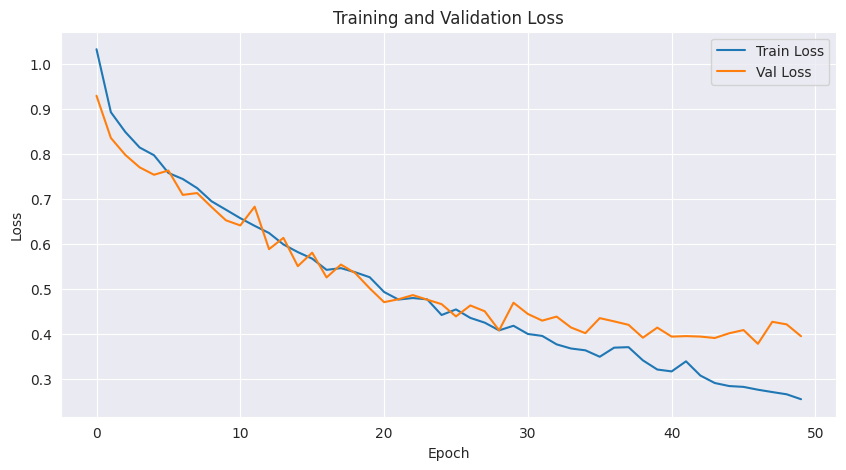

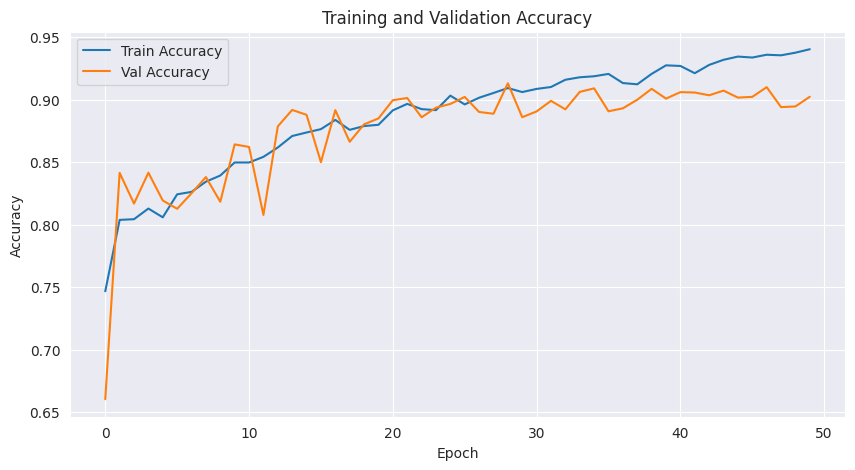

In [29]:
########################################
# Plotting the results
########################################

plt.figure(figsize=(10,5))
plt.title("Training and Validation Loss")
plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='Val Loss')
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()
plt.show()

plt.figure(figsize=(10,5))
plt.title("Training and Validation Accuracy")
plt.plot(train_accuracies, label='Train Accuracy')
plt.plot(val_accuracies, label='Val Accuracy')
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()
plt.show()

## Plottings

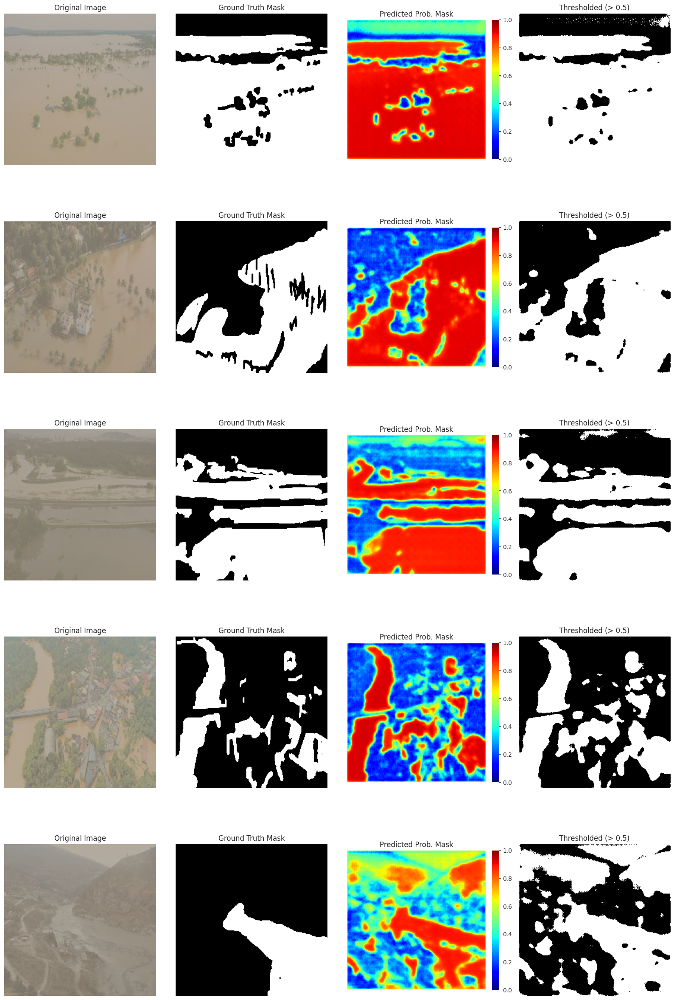

In [33]:
import matplotlib.pyplot as plt
import torch
import numpy as np

def visualize_masks(model, dataloader, device, num_samples=5, threshold=0.5):
    """
    Visualizes:
      - The original input image
      - The original (ground truth) mask
      - The predicted probability mask
      - The thresholded predicted mask

    It samples a few images from the given dataloader and displays them in a grid.

    Args:
        model (nn.Module): Trained segmentation model.
        dataloader (DataLoader): DataLoader from which to sample images.
        device (torch.device): Computation device (CPU/GPU).
        num_samples (int): Number of samples to visualize.
        threshold (float): Threshold to binarize predictions.
    """
    model.eval()
    samples_visualized = 0

    # Number of columns for subplots: original image, ground truth mask, predicted probability map, thresholded mask
    num_cols = 4
    plt.figure(figsize=(4 * num_cols, 5 * num_samples))

    with torch.no_grad():
        for imgs, masks in dataloader:
            imgs = imgs.to(device)
            masks = masks.to(device)

            # Forward pass
            outputs = model(imgs)

            # Move to CPU for visualization
            preds_prob = outputs.detach().cpu().numpy()
            preds_binary = (outputs > threshold).float().detach().cpu().numpy()
            masks_np = masks.detach().cpu().numpy()
            imgs_np = imgs.detach().cpu().numpy()

            for i in range(imgs_np.shape[0]):
                if samples_visualized >= num_samples:
                    # If we have visualized the required number of samples, show the figure and return
                    plt.tight_layout()
                    plt.show()
                    return

                # Extract the original image and de-normalize if necessary
                # The code below assumes the images were normalized with ImageNet stats
                # If this is not the case, adjust as needed.
                img = imgs_np[i].transpose(1, 2, 0)
                img = img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
                img = np.clip(img, 0, 1)

                # Ground truth mask
                original_mask = masks_np[i].squeeze()

                # Predicted probability mask and thresholded mask
                predicted_mask_prob = preds_prob[i].squeeze()
                predicted_mask_binary = preds_binary[i].squeeze()

                # Row index for subplot
                row = samples_visualized

                # Plot the original image
                plt.subplot(num_samples, num_cols, row * num_cols + 1)
                plt.imshow(img)
                plt.title("Original Image")
                plt.axis('off')

                # Plot the original (ground truth) mask
                plt.subplot(num_samples, num_cols, row * num_cols + 2)
                plt.imshow(original_mask, cmap='gray')
                plt.title("Ground Truth Mask")
                plt.axis('off')

                # Plot the predicted probability mask
                plt.subplot(num_samples, num_cols, row * num_cols + 3)
                im_prob = plt.imshow(predicted_mask_prob, cmap='jet', vmin=0, vmax=1)
                plt.title("Predicted Prob. Mask")
                plt.axis('off')
                plt.colorbar(im_prob, fraction=0.046, pad=0.04)

                # Plot the thresholded predicted mask
                plt.subplot(num_samples, num_cols, row * num_cols + 4)
                plt.imshow(predicted_mask_binary, cmap='gray')
                plt.title(f"Thresholded (> {threshold})")
                plt.axis('off')

                samples_visualized += 1

    # If num_samples is larger than the dataset and we exit the loop, still show what we have
    plt.tight_layout()
    plt.show()

visualize_masks(model, val_loader, device, num_samples=5, threshold=0.5)


1. **Comparison with Conventional Loss Functions**:
    - How do Dice and Jaccard Losses differ from Cross-Entropy or Mean Squared Error, particularly in terms of sensitivity to class imbalances?
    - What advantages do these losses offer in capturing the spatial overlap between the predicted and true segmentations?

Answer:

Dice and Jaccard losses directly measure the overlap between predicted and true masks, making them more robust against class imbalance since they focus on the ratio of intersection to combined area rather than per-pixel misclassification. They inherently emphasize spatial agreement, unlike cross-entropy or MSE, which treat each pixel independently and can be disproportionately influenced by majority classes.

2. **Interpretation of Loss Values**:
    - Discuss what high or low loss scores reveal about the state and effectiveness of your segmentation model.

Answer:
  
A high loss indicates poor overlap between predictions and ground truths, suggesting the model’s segmentation boundaries are inaccurate. A low loss score signals closer alignment between the predicted and true masks, implying the model is effectively learning to identify and localize the target structures.




Evaluate the role of the attention mechanism in optimizing segmentation accuracy in cluttered environments. How does it refine the segmentation process?

What is the importance of skip connections in U-Net, and how do they enhance the accuracy of segmentation tasks?

Explain the difference between the predicted and processed mask above.

**Attention Mechanism in Cluttered Environments:**  
Attention mechanisms focus the model’s capacity on the most informative regions of the feature maps. By selectively emphasizing relevant spatial details and filtering out noise, attention refines the segmentation process, especially in complex scenes with overlapping or similarly textured objects. This leads to more accurate boundary delineations and improved robustness in identifying target structures.

**Importance of Skip Connections in U-Net:**  
Skip connections bridge the encoder and decoder paths, reintroducing high-resolution spatial features that might be lost during downsampling. They help the network recover fine-grained details, ensuring that the final segmentation is not only semantically correct but also spatially precise, thus enhancing overall segmentation accuracy.

**Difference Between Predicted and Processed Mask:**  
The predicted mask is a continuous probability map indicating the likelihood of each pixel belonging to the target class. The processed (thresholded) mask is a binary version derived from this probability map, translating the continuous values into a definitive segmentation boundary by classifying pixels as either foreground or background based on a chosen threshold.